In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from sklearn.cluster import DBSCAN
import geopandas as gpd

In [2]:
df = pd.read_csv('/content/US_Accidents_March23.csv')
df.head()

<ipython-input-2-3664227dbcc4>:1: DtypeWarning: Columns (29,30,31,32,33,34,35,36,37,38,39,40,41) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/US_Accidents_March23.csv')


,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.01,...,False,False,False,False,True,False,Day,Day,Day,Day


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16809 entries, 0 to 16808
Data columns (total 46 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     16809 non-null  object 
 1   Source                 16809 non-null  object 
 2   Severity               16809 non-null  int64  
 3   Start_Time             16809 non-null  object 
 4   End_Time               16809 non-null  object 
 5   Start_Lat              16809 non-null  float64
 6   Start_Lng              16809 non-null  float64
 7   End_Lat                0 non-null      float64
 8   End_Lng                0 non-null      float64
 9   Distance(mi)           16809 non-null  float64
 10  Description            16809 non-null  object 
 11  Street                 16809 non-null  object 
 12  City                   16809 non-null  object 
 13  County                 16809 non-null  object 
 14  State                  16809 non-null  object 
 15  Zi

In [4]:
df.isnull().sum()

,0
ID,0
Source,0
Severity,0
Start_Time,0
End_Time,0
Start_Lat,0
Start_Lng,0
End_Lat,16809
End_Lng,16809
Distance(mi),0


In [5]:
df['Start_Time'] = pd.to_datetime(df['Start_Time'])

In [6]:
df['Hour'] = df['Start_Time'].dt.hour

In [7]:
df['DayofWeek'] = df['Start_Time'].dt.dayofweek

In [8]:
weather = df['Weather_Condition']

In [9]:
df = df.dropna(subset = ['Weather_Condition', 'Start_Time'])

In [10]:
hour_accident = df.groupby('Hour').size()

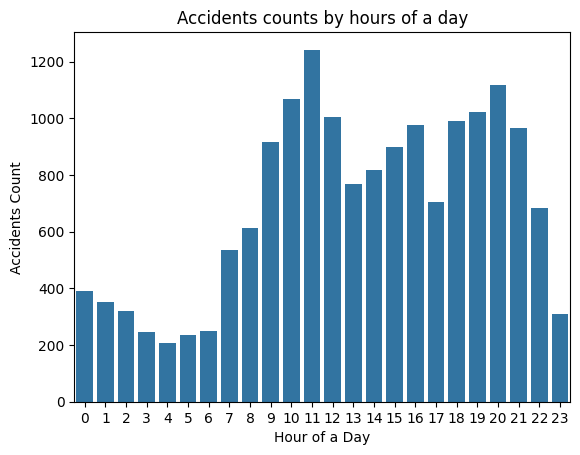

In [11]:
sns.barplot(x = hour_accident.index, y = hour_accident.values)
plt.xlabel('Hour of a Day')
plt.ylabel('Accidents Count')
plt.title("Accidents counts by hours of a day");

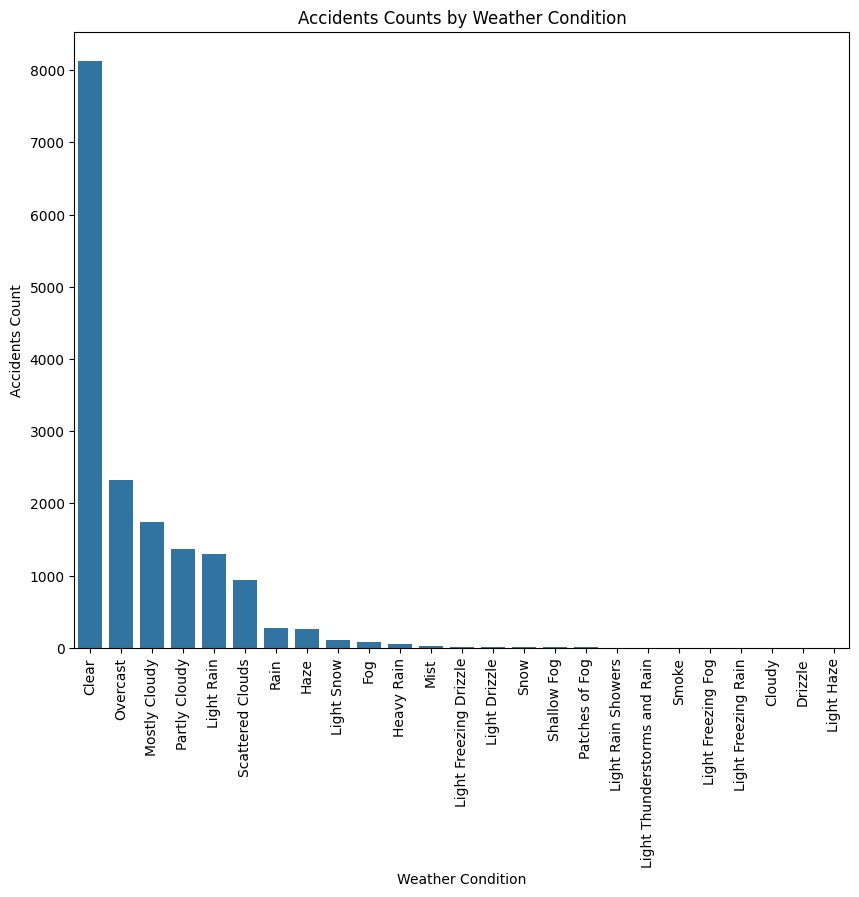

In [12]:
weather_accident = df['Weather_Condition'].value_counts()
plt.figure(figsize = (10, 8))
sns.barplot(x = weather_accident.index, y = weather_accident.values)
plt.xticks(rotation = 90)
plt.xlabel('Weather Condition')
plt.ylabel('Accidents Count')
plt.title("Accidents Counts by Weather Condition");

In [13]:
lat_lon = df[['Start_Lat', 'Start_Lng']]

In [14]:
heatmap = folium.Map(location = [df['Start_Lat'].mean(), df['Start_Lng'].mean()], zoom_start = 6)

In [15]:
for idx, row in df.iterrows():
    folium.CircleMarker([row['Start_Lat'], row['Start_Lng']],
                        radius = 1,
                        color = 'red').add_to(heatmap)

heatmap

In [16]:
dbc = DBSCAN(eps = 0.01, min_samples = 50).fit(lat_lon)
labels = dbc.labels_

In [17]:
df['Cluster'] = labels

In [18]:
cluster_map = folium.Map(location = [df['Start_Lat'].mean(), df['Start_Lng'].mean()], zoom_state = 6)

for idx, row in df.iterrows():
    if row['Cluster'] != -1:
        folium.CircleMarker([row['Start_Lat'], row['Start_Lng']],
                            radius = 1,
                            color = 'blue').add_to(cluster_map);


cluster_map